Importing libraries

In [ ]:
import numpy as np
import pandas as pd
import os.path as op
from glob import glob
import re

import nibabel as nib
from nibabel.testing import data_path

!pip install nilearn
import nilearn
from nilearn import plotting
from nilearn import image

from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, confusion_matrix 
from sklearn.feature_selection import VarianceThreshold

import xgboost as xgb
from xgboost.sklearn import XGBClassifier


import copy as cp
import seaborn as sns
from typing import Tuple
from sklearn.metrics import confusion_matrix
import scipy.stats
from collections import Counter

import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.6 MB 3.6 MB/s 


Accessing and loading in the data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Locating data on the drive

In [ ]:
import os
root_dir = "/content/drive/My Drive/"
project_folder = "PALS0025/ASD"
os.chdir(root_dir + project_folder)
os.getcwd()

'/content/drive/My Drive/PALS0025/ASD'

Loading in subject data.

Creating a dictionary that maps participant IDs to their phenotypes (and adding a missing value).

In [ ]:
subjects_data = pd.read_csv('ndar_subject01.txt', sep='\t')
subject_ids = dict(zip(subjects_data.src_subject_id, subjects_data.phenotype))
subject_ids['471A'] = 'ASD'

In [ ]:
spmt_files = glob('*spmT_000*')
print(spmt_files)
len(spmt_files)

['594C_spmT_0002.nii', '130A_V2_spmT_0002.nii', '133C_spmT_0002.nii', '145C_V2_spmT_0002.nii', '198A_V2_spmT_0002.nii', '407C_spmT_0002.nii', '409A_V2_spmT_0002.nii', '420A_V2_spmT_0002.nii', '424C_spmT_0002.nii', '427A_spmT_0002.nii', '429C_spmT_0002.nii', '432A_spmT_0002.nii', '438C_spmT_0002.nii', '441C_spmT_0002.nii', '448A_V2_spmT_0002.nii', '463C_spmT_0002.nii', '467C_spmT_0002.nii', '469A_spmT_0002.nii', '471A_spmT_0002.nii', '473A_spmT_0002.nii', '524C_spmT_0002.nii', '553C_spmT_0002.nii', '587A_spmT_0002.nii', '489C_spmT_0001.nii', '490A_spmT_0001.nii', '491A_spmT_0001.nii', '507C_spmT_0001.nii', '508A_spmT_0001.nii', '526C_spmT_0001.nii', '533A_spmT_0001.nii', '536A_spmT_0001.nii', '537C_spmT_0001.nii', '540C_spmT_0001.nii', '542A_spmT_0001.nii', '559A_spmT_0001.nii', '563A_spmT_0001.nii', '571A_spmT_0001.nii', '576A_spmT_0001.nii', '577A_spmT_0001.nii', '584A_spmT_0001.nii', '586A_spmT_0001.nii', '588A_spmT_0001.nii', '590C_spmT_0001.nii', '592C_spmT_0001.nii', '484C_spmT_00

51

Checking the shape of data and asserting that all images have equal dimensions

In [ ]:
# Confirm that all spmT files have the same dimensions as the first file (and therefore are all of equal dimensions)
all(nib.load(x).shape == nib.load(spmt_files[0]).shape for x in spmt_files)

True

In [ ]:
# Storing the image dimensions in a variable  
data = nib.load(spmt_files[0])
voxel_dims = data.shape
voxel_dims

(53, 63, 52)

In [ ]:
# QA assurance: how many voxels are non-zero? unravel the matrix, sort, print the number of non-zero values and 10 highest values
t_stats = np.zeros((len(spmt_files), np.prod(voxel_dims)))

for subject, tstat_file in enumerate(spmt_files):
  
    data = nib.load(tstat_file).get_data()
    t_stat = data.ravel()
    max_10 = np.sort(t_stat)
    non_zero = [x for x in t_stat if x != 0]
    sub_ID = re.sub('_spmT_.+', '', tstat_file)
    print(sub_ID, "non zero voxels: ", len(non_zero), " 10 max values: ", max_10[:20])

594C non zero voxels:  50890  10 max values:  [-6.245729  -6.13562   -6.0117345 -6.003466  -5.982483  -5.965628
 -5.9589624 -5.8282332 -5.739724  -5.739133  -5.7075577 -5.687325
 -5.6197405 -5.5768714 -5.534458  -5.47626   -5.4628124 -5.4102864
 -5.405181  -5.385259 ]
130A_V2 non zero voxels:  45928  10 max values:  [-7.4584665 -7.080721  -7.032456  -6.9898005 -6.2969584 -6.269596
 -6.1669946 -6.057643  -5.9919944 -5.975734  -5.948078  -5.8569784
 -5.7688446 -5.7619143 -5.7507257 -5.703399  -5.659378  -5.635451
 -5.613266  -5.611508 ]
133C non zero voxels:  51603  10 max values:  [-8.316242  -7.709754  -7.398543  -7.317245  -7.3060665 -7.1702666
 -7.1434507 -6.9600472 -6.9021673 -6.822067  -6.7888594 -6.777635
 -6.7712173 -6.7393    -6.6903677 -6.67874   -6.640073  -6.631223
 -6.592555  -6.585124 ]
145C_V2 non zero voxels:  45552  10 max values:  [-10.096188   -9.801706   -8.78854    -8.6583395  -8.5810795  -8.534272
  -8.527859   -8.302926   -8.160103   -8.147052   -8.072734   -8.0688

Loading an atlas of the brain

In [ ]:
from nilearn.datasets import fetch_atlas_schaefer_2018
# It can return different number of ROIs; we'll set it to 100
n_rois = 100
schaefer_parc = fetch_atlas_schaefer_2018(n_rois = n_rois, resolution_mm=2, yeo_networks=17, verbose=False)
# Insert Background label under the index 0 because it is missing in the array
schaefer_parc.labels = np.insert(schaefer_parc.labels, 0, 'Background')

Create a dictionary mapping indices to anatomical labels

In [ ]:
labels_dict_100 = dict(enumerate(schaefer_parc.labels))

Creating a list of anatomical labels

In [ ]:
feat_names_100 = schaefer_parc.labels.tolist()
feat_names_100 = [x.decode('UTF-8') for x in feat_names_100]

The resolution of the map differs from that of the dataset so it needs to be downsized by resampling

Shape of the resampled ROI map: (53, 63, 52)


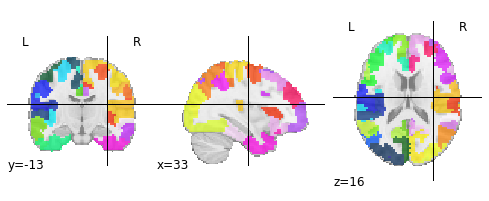

In [ ]:
# Set interpolation to nearest, because we're dealing with discrete integers
schaefer_rois = image.resample_to_img(schaefer_parc['maps'], spmt_files[0], interpolation='nearest')
print("Shape of the resampled ROI map: {}".format(schaefer_rois.shape))
plotting.plot_roi(schaefer_rois)

In [ ]:
roin_ints = schaefer_rois.get_fdata()
np.unique(roin_ints)

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100.])

Compute the ROI-average activity for each of our subjects across 100 ROIs in the Schaefer parcellation and store the new features in a 2D numpy matrix (flattened from a 3D array) of N-samples (participants) by N-features (tstats averaged by ROI)

In [ ]:
from nilearn.input_data import NiftiLabelsMasker
label_masker = NiftiLabelsMasker(labels_img=schaefer_rois, strategy='mean')

def average_roi(spm_file):
  label_masker.fit(spm_file)
  averaged_roi = label_masker.transform(spm_file)
  return averaged_roi


X_100 = np.zeros((len(spmt_files), n_rois))
phenotype_ls = []
subj_ls = []

for subject, tstat in enumerate(spmt_files):
    # average ROIs for each file and add in new row of matrix X
    avg_roi = average_roi(tstat)
    X_100[subject,:] = avg_roi

    # extract subject ID from file name, fetch phenotype and append to a list
    sub_ID = tstat
    sub_ID = re.sub('_spmT_.+', '', sub_ID)
    subj_ls.append(sub_ID)
    phen = subject_ids[sub_ID]
    phenotype_ls.append(phen)

X_100 = np.insert(X_100, 0, np.zeros(len(spmt_files)), axis=1) 

In [ ]:
X_100.shape

(51, 101)

In [ ]:
len(phenotype_ls)

51

In [ ]:
# create a dict subj > phenotype only for the final group
subj_to_phenotype = dict((k, v) for k, v in subject_ids.items() if k in subj_ls)
# get a separate list of spmt files for each phenotype
spmt_files_asd = [spmt for spmt in spmt_files if subj_to_phenotype[re.sub('_spmT_.+', '', spmt)] == 'ASD']
spmt_files_td = [spmt for spmt in spmt_files if subj_to_phenotype[re.sub('_spmT_.+', '', spmt)] == 'TD']

func_mean_asd = image.mean_img(spmt_files_asd)
func_mean_td = image.mean_img(spmt_files_td)

In [ ]:
asd_func_mean = image.mean_img(spmt_files_asd)

plotting.view_img_on_surf(
    stat_map_img=asd_func_mean,
    surf_mesh='fsaverage5', threshold='75%')

In [ ]:
td_func_mean = image.mean_img(spmt_files_td)

plotting.view_img_on_surf(
    stat_map_img=td_func_mean,
    surf_mesh='fsaverage5', threshold='75%')

Converting the phenotype list to a string of binary values to create the dependent variable y - phenotype labels.

In [ ]:
le = LabelEncoder()
le.fit(phenotype_ls)
y = le.transform(phenotype_ls)
y

array([1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 0])

In [ ]:
# Transform labels back to the original encoding
phen_labels = le.inverse_transform(y)
# Check how many instances of each class
count = Counter(phen_labels)
print(count)

Counter({'ASD': 27, 'TD': 24})


The dataset is imbalanced, i.e. there are more instances of one class than the other. This can introduce a bias towards the more numerous class in the model training, however it can be balanced back to equilibrium by adding a proportionate weight to the model. 

In [ ]:
from collections import Counter
counter = Counter(y)
class_weights = counter[0]/counter[1]
class_weights

1.125

Pattern preprocessing (feature scaling to z-score) and variance thresholding (removing all features with value of 0). 

In [ ]:
xgb_model = xgb.XGBClassifier()
scaler = StandardScaler()

from sklearn.pipeline import Pipeline

pipeline_to_make = [('varthres', VarianceThreshold()),
                    ('preproc', scaler),
                    ('xgb_model', xgb_model)]

my_pipe = Pipeline(pipeline_to_make)

sss = StratifiedShuffleSplit(n_splits=4, test_size=0.2, random_state=100)

In [ ]:
# hyperparameter grid should be stored as a dictionary
hyper_grid = {
    'xgb_model__max_depth': np.arange(1, 7, 1),        #python range end is not inclusive
    'xgb_model__learning_rate': np.arange(0.01, 0.16, 0.03),
    'xgb_model__gamma': np.arange(0, 8, 1),
    'xgb_model__colsample_bytree ': np.arange(0.1, 0.9, 0.2),
    'xgb_model__n_estimators': np.arange(50, 301, 50),
    'xgb_model__scale_pos_weight': [class_weights]
}

In [ ]:
CV = GridSearchCV(my_pipe, hyper_grid, verbose=1, cv=sss)
CV.fit(X_100, y)

Fitting 4 folds for each of 5760 candidates, totalling 23040 fits


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=4, random_state=100, test_size=0.2,
            train_size=None),
             estimator=Pipeline(steps=[('varthres', VarianceThreshold()),
                                       ('preproc', StandardScaler()),
                                       ('xgb_model', XGBClassifier())]),
             param_grid={'xgb_model__colsample_bytree ': array([0.1, 0.3, 0.5, 0.7]),
                         'xgb_model__gamma': array([0, 1, 2, 3, 4, 5, 6, 7]),
                         'xgb_model__learning_rate': array([0.01, 0.04, 0.07, 0.1 , 0.13]),
                         'xgb_model__max_depth': array([1, 2, 3, 4, 5, 6]),
                         'xgb_model__n_estimators': array([ 50, 100, 150, 200, 250, 300]),
                         'xgb_model__scale_pos_weight': [1.125]},
             verbose=1)

In [ ]:
best_score = CV.best_score_
print("Best parameters: ", CV.best_params_)    
print("Best score: ", best_score)
best_model = CV.best_estimator_
tuned_xgb = best_model['xgb_model']

Best parameters:  {'xgb_model__colsample_bytree ': 0.1, 'xgb_model__gamma': 0, 'xgb_model__learning_rate': 0.01, 'xgb_model__max_depth': 3, 'xgb_model__n_estimators': 50, 'xgb_model__scale_pos_weight': 1.125}
Best score:  0.75


Plot confusion matrix for CV

In [ ]:
# get confusion matrix for cv 

def cross_val_predict(model, kfold: sss, X: np.array, y: np.array) -> Tuple[np.array, np.array, np.array]:
    model_ = cp.deepcopy(model)
    no_classes = len(np.unique(y))
    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes]) 

    for train_ndx, test_ndx in sss.split(X, y):
        train_X, train_y, test_X, test_y = X[train_ndx], y[train_ndx], X[test_ndx], y[test_ndx]
        actual_classes = np.append(actual_classes, test_y)
        model_.fit(train_X, train_y)
    

        predicted_classes = np.append(predicted_classes, model_.predict(test_X))
        try:
            predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)
        except:
            predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

    return actual_classes, predicted_classes, predicted_proba

In [ ]:
actual_classes, predicted_classes, _ = cross_val_predict(best_model, sss, X_100, y)

In [ ]:
# visualise confusion matrix
def plot_confusion_matrix(actual_classes: np.array, predicted_classes: np.array, sorted_labels: list):
    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)
    sorted_labels = ['ASD', 'TD']
    plt.figure(figsize=(12.8,6))
    sns.heatmap(matrix, annot=True, xticklabels=sorted_labels, yticklabels=sorted_labels, cmap="Blues", fmt="g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

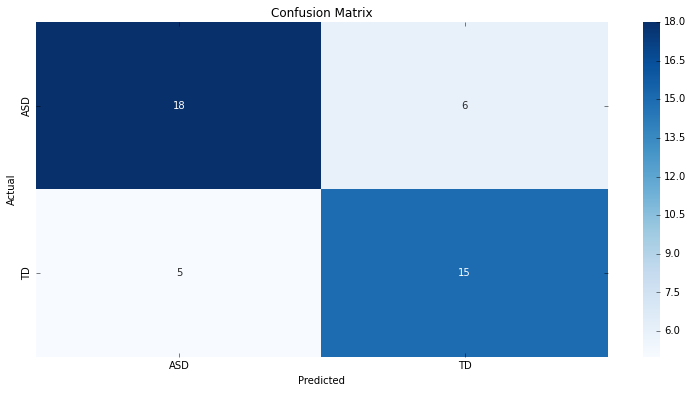

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [0, 1])

In [ ]:
from sklearn.model_selection import permutation_test_score
permutation_test_score(best_model, X_100, y, cv=sss, n_permutations=300, random_state=1000, verbose=1)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:   31.2s finished


(0.75, array([0.5       , 0.59090909, 0.59090909, 0.5       , 0.45454545,
        0.5       , 0.59090909, 0.47727273, 0.65909091, 0.45454545,
        0.47727273, 0.40909091, 0.38636364, 0.54545455, 0.54545455,
        0.43181818, 0.59090909, 0.45454545, 0.40909091, 0.65909091,
        0.5       , 0.52272727, 0.65909091, 0.65909091, 0.5       ,
        0.45454545, 0.56818182, 0.43181818, 0.47727273, 0.5       ,
        0.29545455, 0.47727273, 0.43181818, 0.43181818, 0.25      ,
        0.47727273, 0.52272727, 0.43181818, 0.5       , 0.56818182,
        0.43181818, 0.34090909, 0.47727273, 0.45454545, 0.5       ,
        0.43181818, 0.5       , 0.56818182, 0.38636364, 0.45454545,
        0.52272727, 0.56818182, 0.56818182, 0.40909091, 0.54545455,
        0.52272727, 0.25      , 0.5       , 0.52272727, 0.45454545,
        0.68181818, 0.47727273, 0.47727273, 0.56818182, 0.47727273,
        0.34090909, 0.5       , 0.61363636, 0.56818182, 0.43181818,
        0.52272727, 0.59090909, 0.43181818

In [ ]:
from tqdm.notebook import tqdm
n_permutations = 1000
permuted_accuracies = np.zeros(n_permutations)

for i in tqdm(range(n_permutations)):

    folds = sss.split(X_100, y)
    fold_accuracies = np.zeros(sss.get_n_splits())

    for ii, (train_idx, test_idx) in enumerate(folds):
    
        X_train, X_test = X_100[train_idx], X_100[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
    
        # Here we shuffle the y-train labels
        np.random.shuffle(y_train)
        
        best_model.fit(X_train, y_train)
        preds = best_model.predict(X_test)
        fold_accuracies[ii] = roc_auc_score(y_test, preds)
    
    permuted_accuracies[i] = np.mean(fold_accuracies)

  0%|          | 0/1000 [00:00<?, ?it/s]

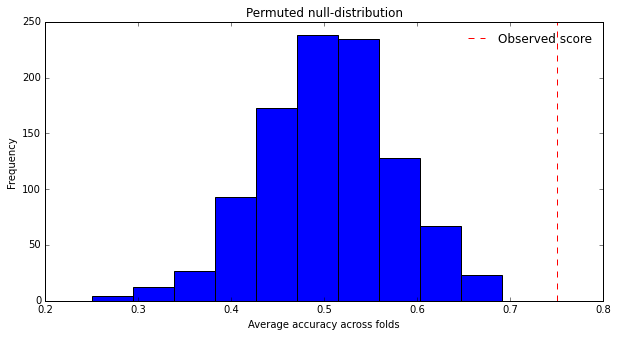

In [ ]:
plt.figure(figsize=(10, 5))
plt.title('Permuted null-distribution')
plt.hist(permuted_accuracies)
plt.xlabel('Average accuracy across folds')
plt.ylabel('Frequency')
plt.axvline(best_score, c='r', ls='--')
plt.legend(['Observed score'], frameon=False)
plt.show()

Report feature importance

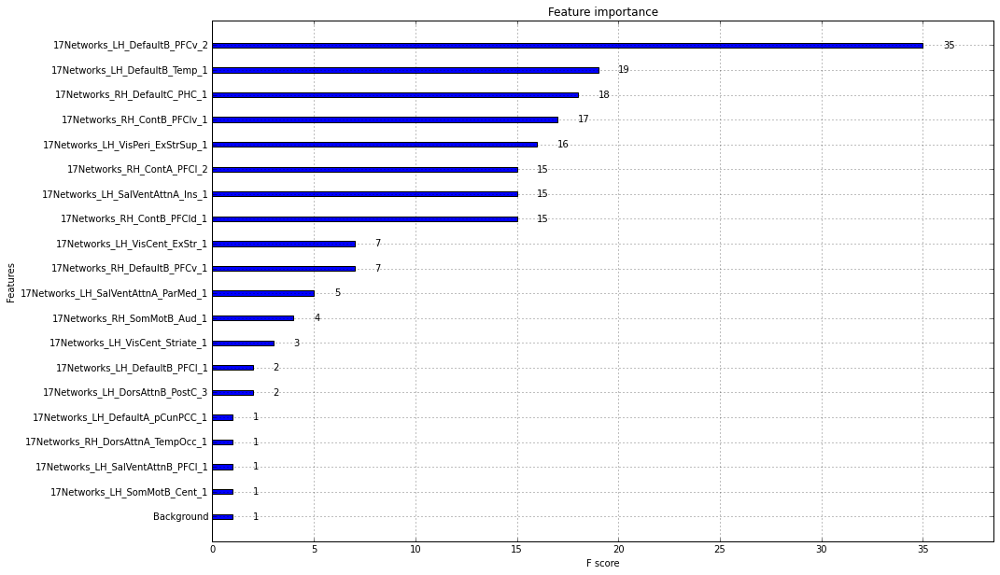

In [ ]:
from xgboost import plot_importance

tuned_xgb.get_booster().feature_names = feat_names_100
ax = xgb.plot_importance(tuned_xgb.get_booster())
fig = ax.figure
fig.set_size_inches(15, 10)

In [ ]:
imp_list = tuned_xgb.feature_importances_
fnames = tuned_xgb.get_booster().feature_names
importa = dict(zip(fnames, imp_list))
thresh = importa['Background'] 
thresh

0.025651399

In [ ]:
# cuting off features of importance value below that of the background noise (might delete this part bc duplicated later)
for k, v in importa.items():
  if v <= thresh:
    importa[k] = 0 

In [ ]:
# create a dictionary {index: imp_value}
idx100_to_imp_score = dict(enumerate(imp_list))

#make a copy of the identity rois
importance_map = roin_ints.copy()

In [ ]:
# cuting off features of importance value below that of the background noise
for k, v in idx100_to_imp_score.items():
  if v <= thresh:
    idx100_to_imp_score[k] = 0 

In [ ]:
# iterate through the roi map and replace idx with val from the dict
with np.nditer(importance_map, op_flags=['readwrite']) as it:
  for x in it:
    x[...] = idx100_to_imp_score[int(x)]

In [ ]:
#normalize to minmax scale between 0 and 100
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0,1))
impo_normalised = min_max_scaler.fit_transform(importance_map.reshape(-1, importance_map.shape[-1])).reshape(importance_map.shape)

# np array to nifti 3D format
importance_plot = nilearn.image.new_img_like(schaefer_rois, impo_normalised, affine=None, copy_header=False)

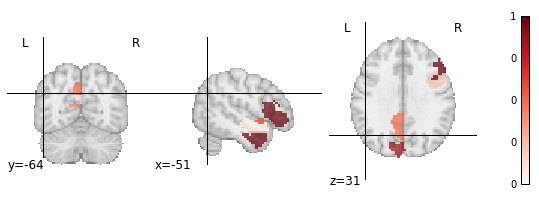

In [ ]:
# plot feature importance
nilearn.plotting.plot_roi(importance_plot, cmap='Reds',  colorbar=True, cut_coords=(-51, -64, 31))

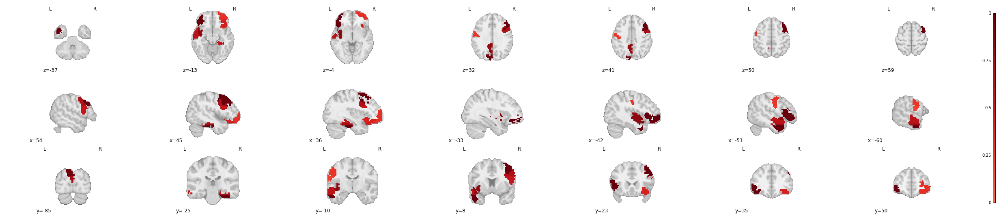

In [ ]:
plotting.plot_stat_map(importance_plot, display_mode='mosaic', cmap='Reds')

In [ ]:
# single-ROI highlighting module

def single_roi(id_matrix, roi_name, f_names, ref_img):
  #id_to_name = dict(enumerate(f_names))
  name_to_id = dict((v, k) for k, v in dict(enumerate(f_names)).items())
  id = name_to_id[roi_name]
  id_mat = id_matrix.copy()
  # replace the ROI indices with 1, set everything else to 0
  with np.nditer(id_mat, op_flags=['readwrite']) as identity:
    for voxel in identity:
      if int(voxel) == id:
        voxel[...] = 100
      else:
        voxel[...] = 0

  # convert the 3D array to nifti format 
  single_roi_mask = nilearn.image.new_img_like(ref_img, id_mat, affine=None, copy_header=False)

  nilearn.plotting.plot_roi(single_roi_mask, title=roi_name)
  plt.show()


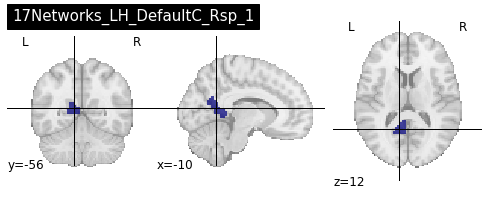

In [ ]:
  single_roi(roin_ints, '17Networks_LH_DefaultC_Rsp_1', fnames, schaefer_rois)

In [ ]:
feat_names_100

['Background',
 '17Networks_LH_VisCent_ExStr_1',
 '17Networks_LH_VisCent_ExStr_2',
 '17Networks_LH_VisCent_Striate_1',
 '17Networks_LH_VisCent_ExStr_3',
 '17Networks_LH_VisPeri_ExStrInf_1',
 '17Networks_LH_VisPeri_StriCal_1',
 '17Networks_LH_VisPeri_ExStrSup_1',
 '17Networks_LH_SomMotA_1',
 '17Networks_LH_SomMotA_2',
 '17Networks_LH_SomMotB_Aud_1',
 '17Networks_LH_SomMotB_S2_1',
 '17Networks_LH_SomMotB_S2_2',
 '17Networks_LH_SomMotB_Cent_1',
 '17Networks_LH_DorsAttnA_TempOcc_1',
 '17Networks_LH_DorsAttnA_ParOcc_1',
 '17Networks_LH_DorsAttnA_SPL_1',
 '17Networks_LH_DorsAttnB_PostC_1',
 '17Networks_LH_DorsAttnB_PostC_2',
 '17Networks_LH_DorsAttnB_PostC_3',
 '17Networks_LH_DorsAttnB_FEF_1',
 '17Networks_LH_SalVentAttnA_ParOper_1',
 '17Networks_LH_SalVentAttnA_Ins_1',
 '17Networks_LH_SalVentAttnA_Ins_2',
 '17Networks_LH_SalVentAttnA_ParMed_1',
 '17Networks_LH_SalVentAttnA_FrMed_1',
 '17Networks_LH_SalVentAttnB_PFCl_1',
 '17Networks_LH_SalVentAttnB_PFCmp_1',
 '17Networks_LH_LimbicB_OFC_1',


In [ ]:
# create a separate ROI matrix for each group
X_asd = np.zeros((len(spmt_files_asd), n_rois))
for subject, tstat in enumerate(spmt_files_asd):
    # average ROIs for each file and add in new row of matrix X
    avg_roi = average_roi(tstat)
    X_asd[subject,:] = avg_roi
X_asd = np.insert(X_asd, 0, np.zeros(len(spmt_files_asd)), axis=1) 

X_td = np.zeros((len(spmt_files_td), n_rois))
for subject, tstat in enumerate(spmt_files_td):
    # average ROIs for each file and add in new row of matrix X
    avg_roi = average_roi(tstat)
    X_td[subject,:] = avg_roi
X_td = np.insert(X_td, 0, np.zeros(len(spmt_files_td)), axis=1) 

print(X_asd.shape, X_td.shape)

(27, 101) (24, 101)


In [ ]:
# convert to df, make a column values boxplot
df_100_asd = pd.DataFrame(X_asd, columns=fnames)
df_100_td = pd.DataFrame(X_td, columns=fnames)
mmm = df_100_asd['17Networks_LH_SalVentAttnA_ParOper_1']
nnn = df_100_td['17Networks_LH_SalVentAttnA_ParOper_1']

In [ ]:
def compare_boxplots(feat_name, df_asd, df_td):
  asd_col = df_asd[feat_name]
  td_col = df_td[feat_name]
  figgg, axxx = plt.subplots()
  axxx.set_title(feat_name)
  ax = axxx.boxplot([asd_col, td_col], patch_artist=True)
  plt.xticks([1, 2], ["ASD", "TD"])
  colors = ['lightblue', 'lightgreen']
  for bplot in ax:
    for patch, color in zip(ax['boxes'], colors):
        patch.set_facecolor(color)
  plt.show()

In [ ]:
# Get list of important features to create a mask
mask_roi_list = []
for key, val in importa.items():
  if val != 0:
    mask_roi_list.append(key)

len(mask_roi_list)

11

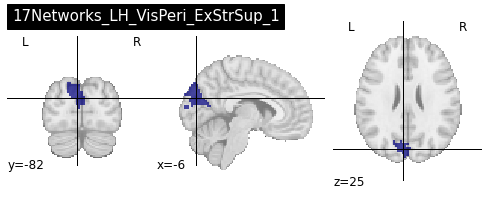

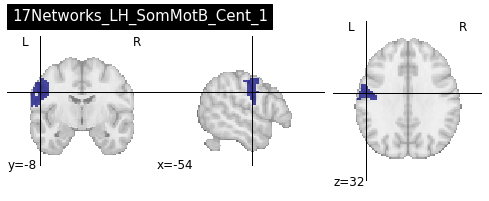

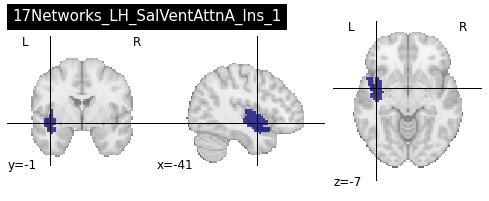

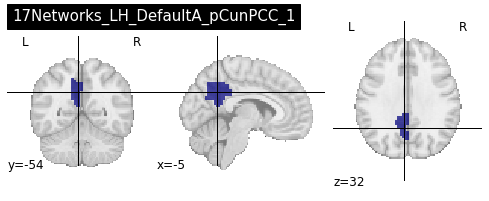

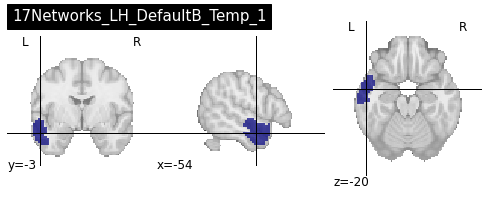

...

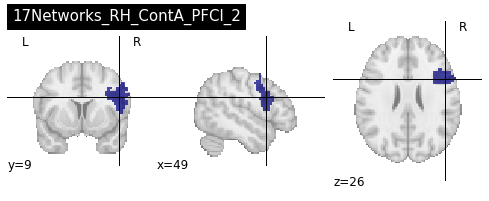

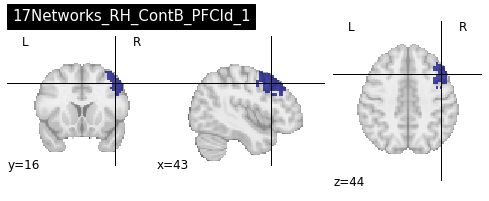

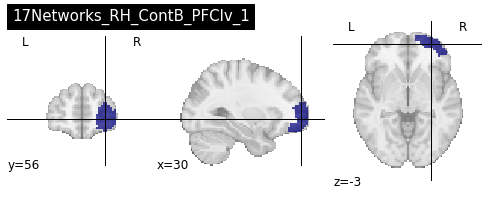

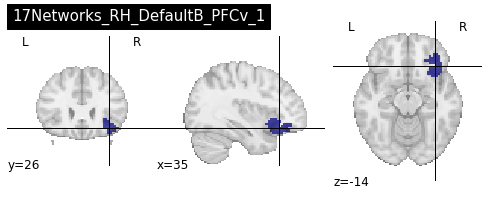

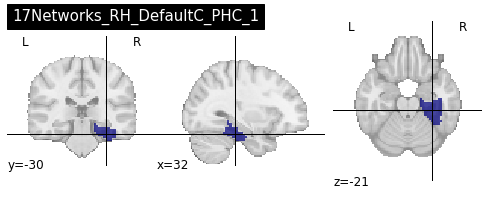

In [ ]:
for roi in mask_roi_list:
  single_roi(roin_ints, roi, fnames, schaefer_rois)


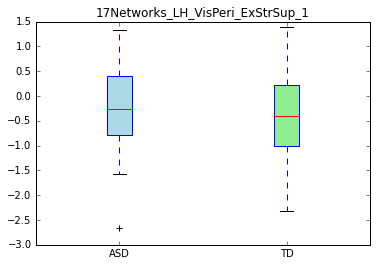

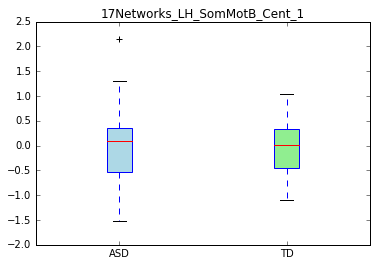

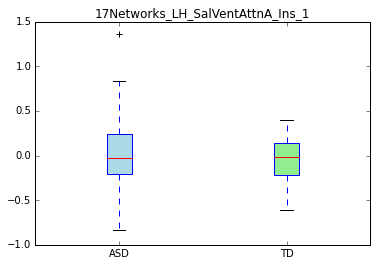

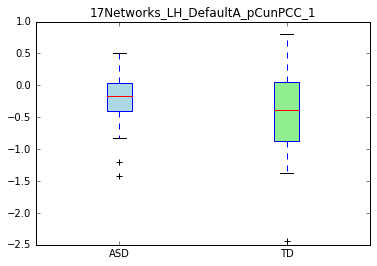

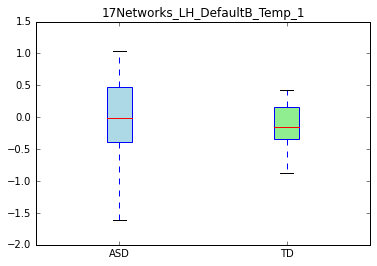

...

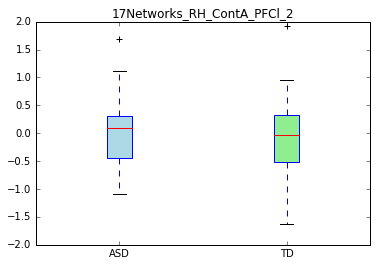

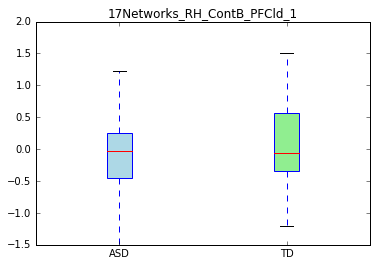

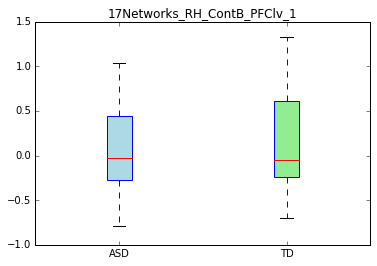

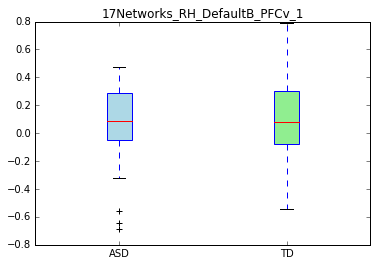

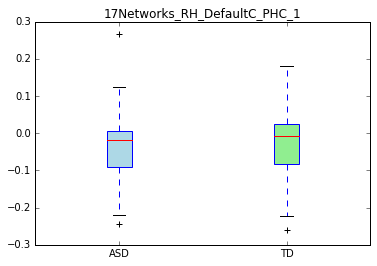

In [ ]:
for roi in mask_roi_list:
  compare_boxplots(roi, df_100_asd, df_100_td)

In [ ]:
mask_roi_list

['17Networks_LH_VisPeri_ExStrSup_1',
 '17Networks_LH_SomMotB_Cent_1',
 '17Networks_LH_SalVentAttnA_Ins_1',
 '17Networks_LH_DefaultA_pCunPCC_1',
 '17Networks_LH_DefaultB_Temp_1',
 '17Networks_LH_DefaultB_PFCv_2',
 '17Networks_RH_ContA_PFCl_2',
 '17Networks_RH_ContB_PFCld_1',
 '17Networks_RH_ContB_PFClv_1',
 '17Networks_RH_DefaultB_PFCv_1',
 '17Networks_RH_DefaultC_PHC_1']

In [ ]:
selected_roi_idx = []
for i in range(len(feat_names_100)):
  if feat_names_100[i] in mask_roi_list:
    selected_roi_idx.append(i)

len(selected_roi_idx)

11

Shape of the resampled ROI map: (53, 63, 52)


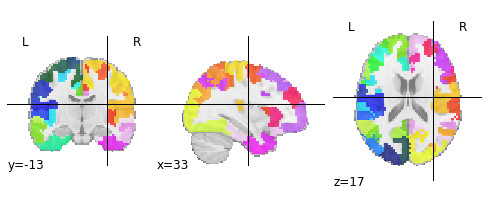

In [ ]:
# repeat the parcellation step, this time with 1000 ROIs

schaefer_parc_500 = fetch_atlas_schaefer_2018(n_rois = 500, resolution_mm=2, yeo_networks=17, verbose=False)
# Insert Background label under the index 0 because it is missing in the array
schaefer_parc_500.labels = np.insert(schaefer_parc_500.labels, 0, 'Background')

# create a list of ROI labels
feat_names_500 = schaefer_parc_500.labels.tolist()
feat_names_500 = [x.decode('UTF-8') for x in feat_names_500]

# Set interpolation to nearest, because we're dealing with discrete integers
schaefer_rois_500 = image.resample_to_img(schaefer_parc_500['maps'], spmt_files[0], interpolation='nearest')
print("Shape of the resampled ROI map: {}".format(schaefer_rois_500.shape))
plotting.plot_roi(schaefer_rois_500)

In [ ]:
# roin_ints - small array
# roin_ints_1000 -big array 

# iterate through the identity matrix (voxels) of the small array and if the value of small_array[n] is not in mask_idx list, 
# then the same-index voxel value in big_array[n] is replaced by 0.
roin_ints_500 = schaefer_rois_500.get_fdata()
importance_map2 = roin_ints_500.copy()
#with np.nditer(importance_map2, op_flags=['readwrite']) as b:
 
for old, new in np.nditer([roin_ints, importance_map2], op_flags=['readwrite']):
  if int(old) not in selected_roi_idx:
    new[...] = 0


In [ ]:
# number of rois in the second phase
n_rois_final = len(np.unique(importance_map2))
n_rois_final

92

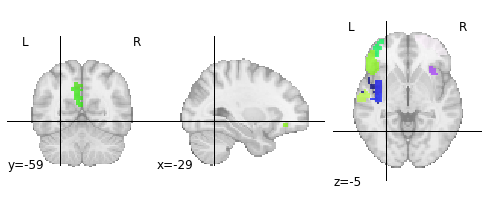

In [ ]:
# convert into nifti and plot final high-resolution ROIs
final_roi_mask = nilearn.image.new_img_like(schaefer_rois_500, importance_map2, affine=None, copy_header=False)
nilearn.plotting.plot_roi(final_roi_mask, cut_coords=(-29, -59, -5))

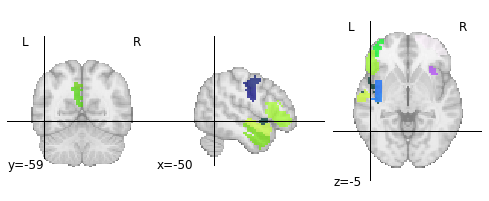

In [ ]:
nilearn.plotting.plot_roi(final_roi_mask, cut_coords=(-50, -59, -5))

Create a new feature matrix X_500 

In [ ]:
label_masker_2 = NiftiLabelsMasker(labels_img=final_roi_mask, strategy='mean')

def average_roi_2(spm_file):
  label_masker_2.fit(spm_file)
  averaged_roi_2 = label_masker_2.transform(spm_file)
  return averaged_roi_2

# -1 from the final number of features because everything unused became 0 and merged with the background
X_final = np.zeros((len(spmt_files), (n_rois_final-1)))

for subject, tstat in enumerate(spmt_files):
    # average ROIs for each file and add in new row of matrix X
    avg_roi = average_roi_2(tstat)
    X_final[subject,:] = avg_roi
# change all the values under label zero to zero to exclude any activity from outside the selected ROIs
X_final[:, 0] =  0

X_final.shape

(51, 91)

Run grid search on the new X with all features

In [ ]:
from sklearn.feature_selection import SelectFromModel
feat_selector = SelectFromModel(estimator=xgb_model)

pipeline_to_make = [('varthres', VarianceThreshold()),
                    ('preproc', scaler),
                    ('xgb_model', xgb_model)]

my_pipe = Pipeline(pipeline_to_make)

hyper_grid_2 = {
    'xgb_model__max_depth': np.arange(1, 4, 1),       
    'xgb_model__learning_rate': np.arange(0.01, 0.26, 0.05),
    'xgb_model__gamma': np.arange(0, 3, 1),
    'xgb_model__colsample_bytree ': np.arange(0.1, 1.2, 0.3),
    'xgb_model__n_estimators': np.arange(50, 305, 50),
    'xgb_model__scale_pos_weight': [class_weights]
}


CV_2 = GridSearchCV(my_pipe, hyper_grid_2, verbose=1, cv=sss)
CV_2.fit(X_final, y)

best_score_final = CV_2.best_score_
print("Best parameters: ", CV_2.best_params_)    
print("Best score: ", best_score_final)
best_model_2 = CV_2.best_estimator_
tuned_xgb_2 = best_model['xgb_model']

Fitting 4 folds for each of 1080 candidates, totalling 4320 fits
Best parameters:  {'xgb_model__colsample_bytree ': 0.1, 'xgb_model__gamma': 0, 'xgb_model__learning_rate': 0.01, 'xgb_model__max_depth': 1, 'xgb_model__n_estimators': 200, 'xgb_model__scale_pos_weight': 1.125}
Best score:  0.5909090909090909


In [ ]:
from sklearn.model_selection import permutation_test_score
permutation_test_score(best_model_2, X_final, y, cv=sss, n_permutations=1000, random_state=1000)

(0.5909090909090909,
 array([0.75      , 0.5       , 0.59090909, 0.43181818, 0.45454545,
        0.45454545, 0.43181818, 0.59090909, 0.40909091, 0.40909091,
        0.52272727, 0.59090909, 0.45454545, 0.45454545, 0.5       ,
        0.52272727, 0.43181818, 0.45454545, 0.5       , 0.70454545,
        0.40909091, 0.5       , 0.59090909, 0.45454545, 0.45454545,
        0.59090909, 0.54545455, 0.70454545, 0.40909091, 0.31818182,
        0.5       , 0.5       , 0.31818182, 0.56818182, 0.47727273,
        0.34090909, 0.40909091, 0.43181818, 0.52272727, 0.59090909,
        0.54545455, 0.43181818, 0.5       , 0.52272727, 0.36363636,
        0.5       , 0.52272727, 0.65909091, 0.38636364, 0.47727273,
        0.43181818, 0.47727273, 0.52272727, 0.52272727, 0.54545455,
        0.63636364, 0.56818182, 0.38636364, 0.70454545, 0.45454545,
        0.59090909, 0.72727273, 0.43181818, 0.43181818, 0.54545455,
        0.43181818, 0.47727273, 0.47727273, 0.47727273, 0.47727273,
        0.63636364, 0.43181

In [ ]:
from tqdm.notebook import tqdm
n_permutations = 1000
permuted_accuracies_2 = np.zeros(n_permutations)

for i in tqdm(range(n_permutations)):

    folds = sss.split(X_final, y)
    fold_accuracies = np.zeros(sss.get_n_splits())

    for ii, (train_idx, test_idx) in enumerate(folds):
    
        X_train, X_test = X_final[train_idx], X_final[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
    
        # Here we shuffle the y-train labels
        np.random.shuffle(y_train)
        
        best_model_2.fit(X_train, y_train)
        preds = best_model_2.predict(X_test)
        fold_accuracies[ii] = roc_auc_score(y_test, preds)
    
    permuted_accuracies_2[i] = np.mean(fold_accuracies)

  0%|          | 0/1000 [00:00<?, ?it/s]

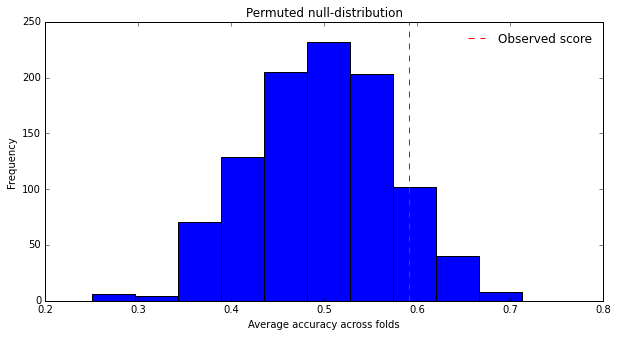

In [ ]:
plt.figure(figsize=(10, 5))
plt.title('Permuted null-distribution')
plt.hist(permuted_accuracies_2)
plt.xlabel('Average accuracy across folds')
plt.ylabel('Frequency')
plt.axvline(best_score_final, c='r', ls='--')
plt.legend(['Observed score'], frameon=False)
plt.show()

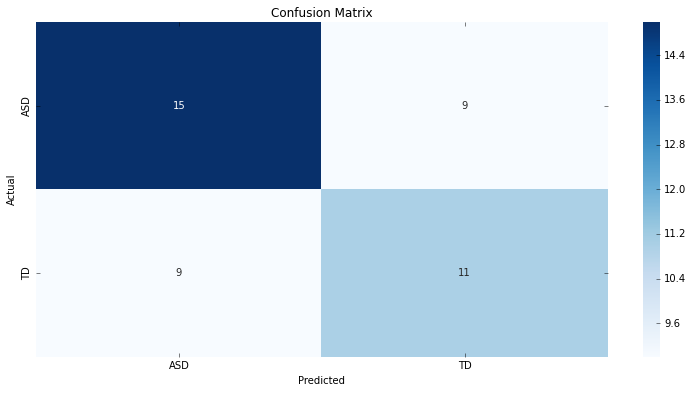

In [ ]:
actual_classes, predicted_classes, _ = cross_val_predict(best_model_2, sss, X_final, y)
plot_confusion_matrix(actual_classes, predicted_classes, [0, 1])

plot feature importance 

In [ ]:
labels_dict_500 = dict(enumerate(schaefer_parc_500.labels))

feat_names_500 = [labels_dict_500[i] for i in np.unique(roin_ints_500)]
feat_names_500 = [x.decode('UTF-8') for x in feat_names_500]

In [ ]:
second_set_feats = np.unique(importance_map2)
list_152_feat_names = [labels_dict_500[idx].decode('UTF-8') for idx in second_set_feats]

In [ ]:
tuned_xgb_2.get_booster().feature_names = list_152_feat_names #!!!!!! try to change to smaller set of names

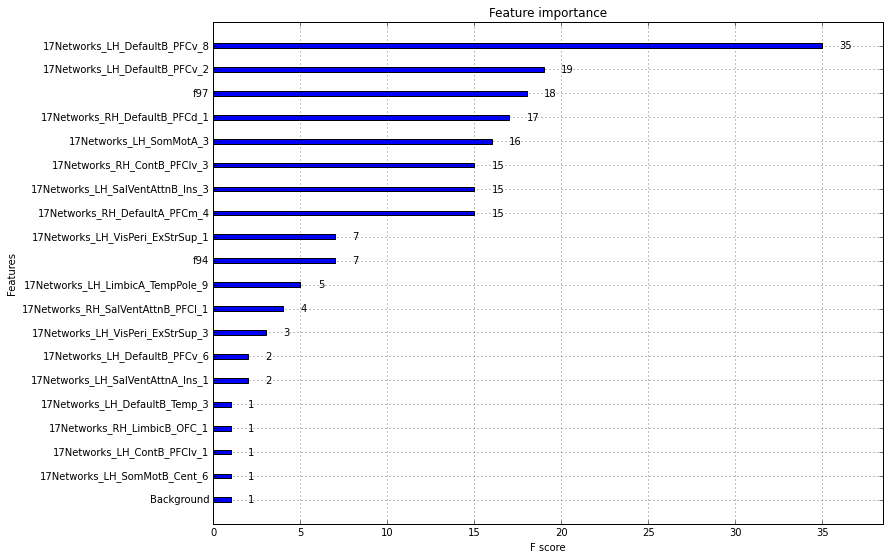

In [ ]:
ax1 = xgb.plot_importance(tuned_xgb_2.get_booster())
fig = ax1.figure
fig.set_size_inches(12, 9)

In [ ]:
len(tuned_xgb.get_booster().feature_names)

92

In [ ]:
  # get list of importance values
imp_list2 = tuned_xgb_2.feature_importances_
idx500_to_imp_score = dict(enumerate(imp_list2))

In [ ]:
# Get list of important features 
mask_roi_list_final = []
ls_impval = []
for key, val in idx500_to_imp_score.items():
  if val != 0:
    mask_roi_list_final.append(key)
    ls_impval.append(val)

len(mask_roi_list_final)

18

In [ ]:
labels_dict_152 = dict(enumerate(list_152_feat_names))

In [ ]:
#list of names of the final features
final_names = [labels_dict_152[n] for n in mask_roi_list_final]

In [ ]:
# create a separate ROI matrix for each group
X_asd_2 = np.zeros((len(spmt_files_asd), n_rois_final-1))
for subject, tstat in enumerate(spmt_files_asd):
    # average ROIs for each file and add in new row of matrix X
    avg_roi = average_roi_2(tstat)
    X_asd_2[subject,:] = avg_roi
X_asd_2 = np.insert(X_asd_2, 0, np.zeros(len(spmt_files_asd)), axis=1) 

X_td_2 = np.zeros((len(spmt_files_td), n_rois_final-1))
for subject, tstat in enumerate(spmt_files_td):
    # average ROIs for each file and add in new row of matrix X
    avg_roi = average_roi_2(tstat)
    X_td_2[subject,:] = avg_roi
X_td_2 = np.insert(X_td_2, 0, np.zeros(len(spmt_files_td)), axis=1) 

print(X_asd_2.shape, X_td_2.shape)

(27, 92) (24, 92)


In [ ]:
# convert to df, make a column values boxplot
df_500_asd = pd.DataFrame(X_asd_2, columns=list_152_feat_names)
df_500_td = pd.DataFrame(X_td_2, columns=list_152_feat_names)

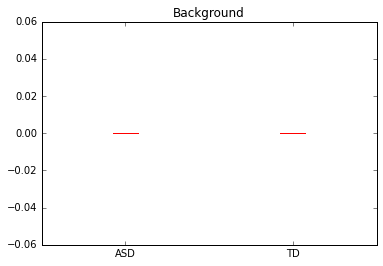

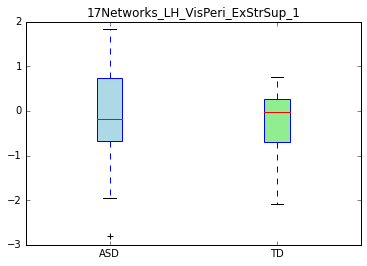

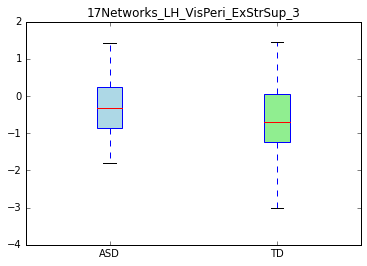

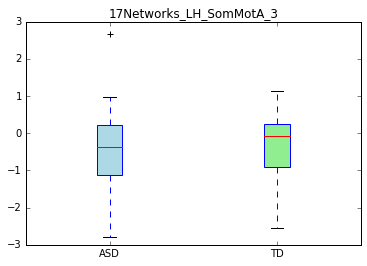

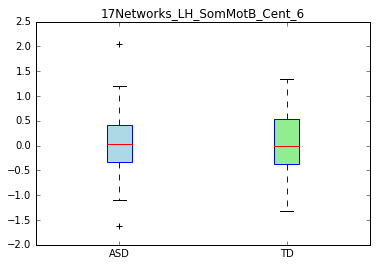

...

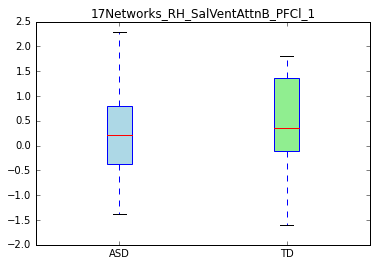

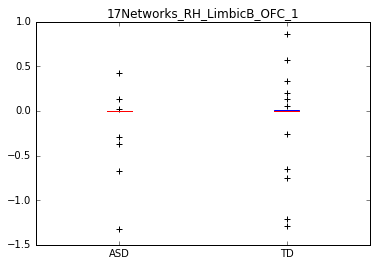

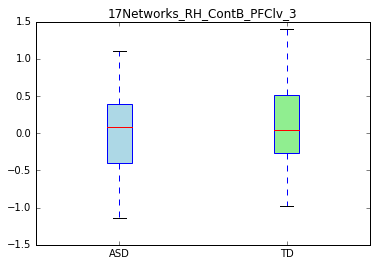

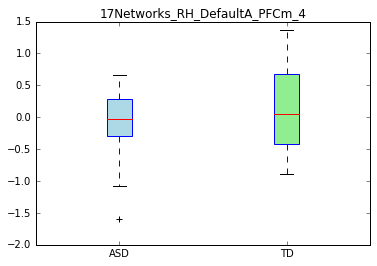

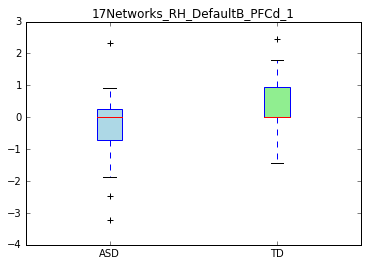

In [ ]:
 for name in final_names:
   compare_boxplots(name, df_500_asd, df_500_td)

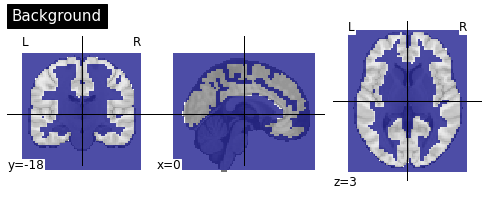

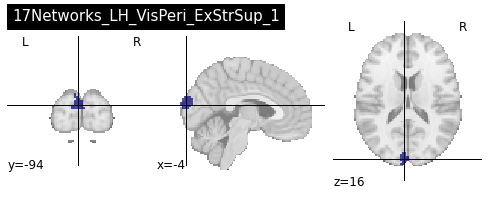

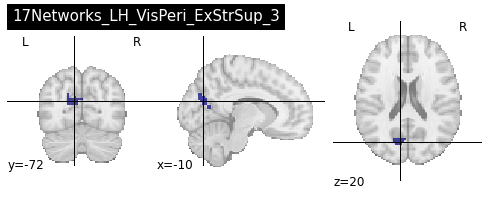

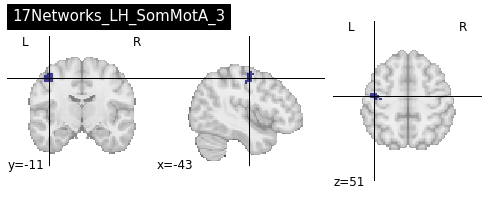

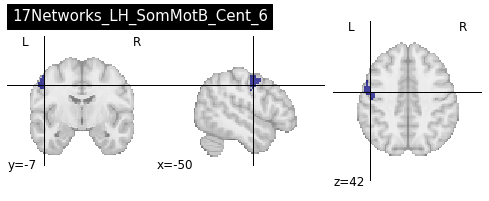

...

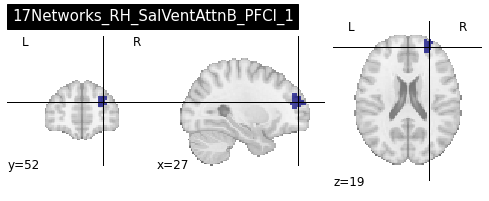

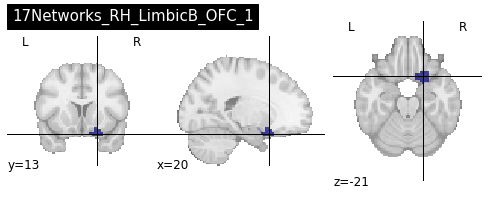

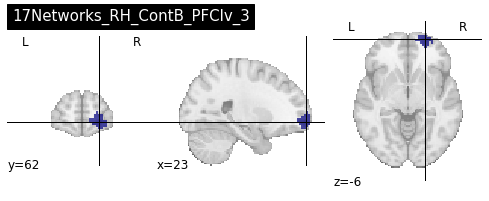

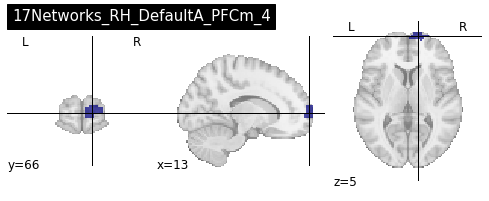

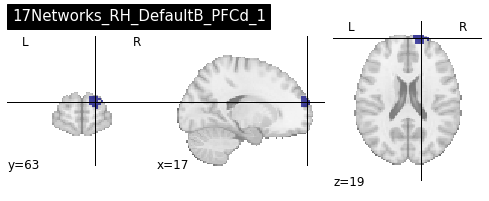

In [ ]:
for name in final_names:
  single_roi(roin_ints_500, name, feat_names_500, schaefer_rois_500)

In [ ]:
# make a copy of the identity rois
importance_map_2 = roin_ints_500.copy()

In [ ]:
# i need a dictionary of big 500 idx to importance values from small 152 list
dic = dict((v.decode('UTF-8'), k) for k, v in labels_dict_500.items())
idx_fin_500 = [dic[name] for name in final_names]
dic500 = dict(zip([dic[name] for name in final_names], ls_impval))
#dic_500 = dict(k, v for k in dic500 and )

In [ ]:
# iterate through the roi map and replace every index with an importance value from a dict index:impo val
with np.nditer(importance_map_2, op_flags=['readwrite']) as it:
  for x in it:
    if x in idx_fin_500:
      x[...] = dic500[int(x)]
    else:
      x[...] = 0

In [ ]:
#normalize to minmax between 0 and 100
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0,1))
impo_normalised2 = min_max_scaler.fit_transform(importance_map_2.reshape(-1, importance_map_2.shape[-1])).reshape(importance_map_2.shape)

# np array to nifti and plot
importance_plot2 = nilearn.image.new_img_like(schaefer_rois_500, impo_normalised2, affine=None, copy_header=False)

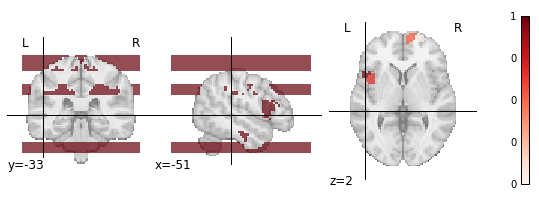

In [ ]:
nilearn.plotting.plot_roi(importance_plot2, cmap='Reds', colorbar=True, cut_coords=(-51, -33, 2))

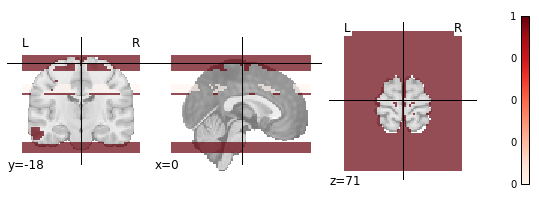

In [ ]:
nilearn.plotting.plot_roi(importance_plot2, cmap='Reds', colorbar=True)

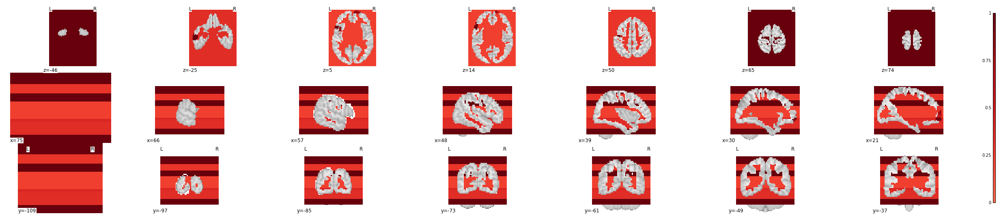

In [ ]:
mosaic2 = plotting.plot_stat_map(importance_plot2, display_mode='mosaic', cmap='Reds')